# Computer Vision Group Project

### This is the jupiter notebook needed to carry out the Computer Vision Group Project

## Setup

### Installations

In [5]:
!pip install decord

### Libraries

In [7]:
import os
import cv2
from decord import VideoReader, cpu
import matplotlib.pyplot as plt
import time

## Frame Extractions

In [9]:
def extract_frames_with_decord(video_path, frames_dir, every=1, overwrite=False):
    os.makedirs(frames_dir, exist_ok=True)

    vr = VideoReader(video_path, ctx=cpu(0))
    total_frames = len(vr)
    saved = 0

    for idx in range(0, total_frames, every):
        frame = vr[idx].asnumpy()
        frame_filename = os.path.join(frames_dir, f"frame_{idx:04d}.jpg")

        if not os.path.exists(frame_filename) or overwrite:
            cv2.imwrite(frame_filename, cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))
            saved += 1

    print(f"{saved} frames saved to {frames_dir}")
    return saved

video_path = "Vid1.mp4"         # path to input video
frames_output = "extracted_frames"  # folder to save frames

extract_frames_with_decord(video_path, frames_output, every=5)

0 frames saved to extracted_frames


0

## Feature Detection and Description

### Loading algorithms

In [12]:
def kps_descriptors(detector, label=""):
    keypoints = []
    descriptors = []

    frame_files = sorted([f for f in os.listdir(frames_output) if f.endswith(".jpg")])

    start_time = time.time()  # Start timing

    for filename in frame_files:
        frame_path = os.path.join(frames_output, filename)
        image = cv2.imread(frame_path, cv2.IMREAD_COLOR)
        if image is None:
            continue
        kps, desc = detector.detectAndCompute(image, None)
        keypoints.append(kps)
        descriptors.append(desc)

    end_time = time.time()  # End timing
    elapsed = end_time - start_time
    print(f"{label} took {elapsed:.2f} seconds to detect and describe {len(keypoints)} frames.")

    return keypoints, descriptors

orb = cv2.ORB_create(nfeatures=1000)
sift = cv2.SIFT_create()
akaze = cv2.AKAZE_create()

orb_kps, orb_desc = kps_descriptors(cv2.ORB_create(nfeatures=1000), label="ORB")
sift_kps, sift_desc = kps_descriptors(cv2.SIFT_create(), label="SIFT")
akaze_kps, akaze_desc = kps_descriptors(cv2.AKAZE_create(), label="AKAZE")

kps_dict = {
    "ORB": orb_kps,
    "SIFT": sift_kps,
    "AKAZE": akaze_kps
}
desc_dict = {
    "ORB": orb_desc,
    "SIFT": sift_desc,
    "AKAZE": akaze_desc
}


ORB took 1.02 seconds to detect and describe 75 frames.
SIFT took 5.25 seconds to detect and describe 75 frames.
AKAZE took 3.73 seconds to detect and describe 75 frames.


### Number of detected features

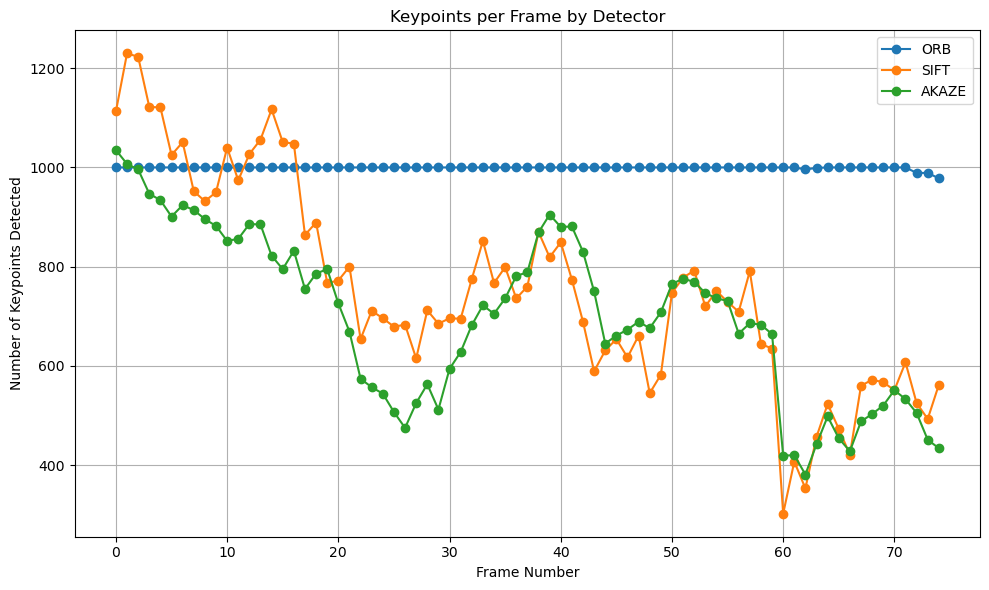

In [24]:
def counts(detector_data):
    plt.figure(figsize=(10, 6))
    for label, keypoints in detector_data:
        frame_numbers = list(range(len(keypoints)))
        keypoint_counts = [len(kps) for kps in keypoints]
        plt.plot(frame_numbers, keypoint_counts, label=label, marker='o')

    plt.xlabel("Frame Number")
    plt.ylabel("Number of Keypoints Detected")
    plt.title("Keypoints per Frame by Detector")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

counts(list(kps_dict.items()))

### Matching performance


Matching frames 0 and 5:


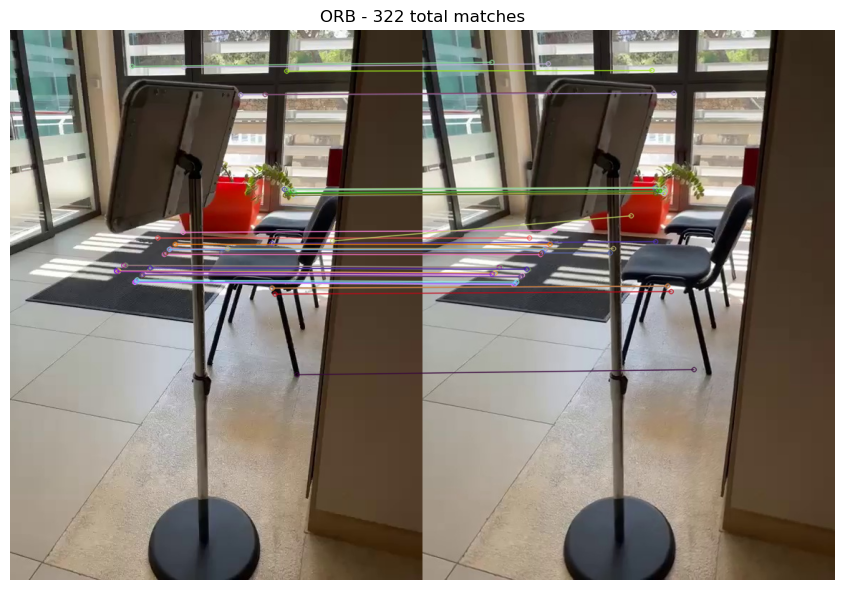

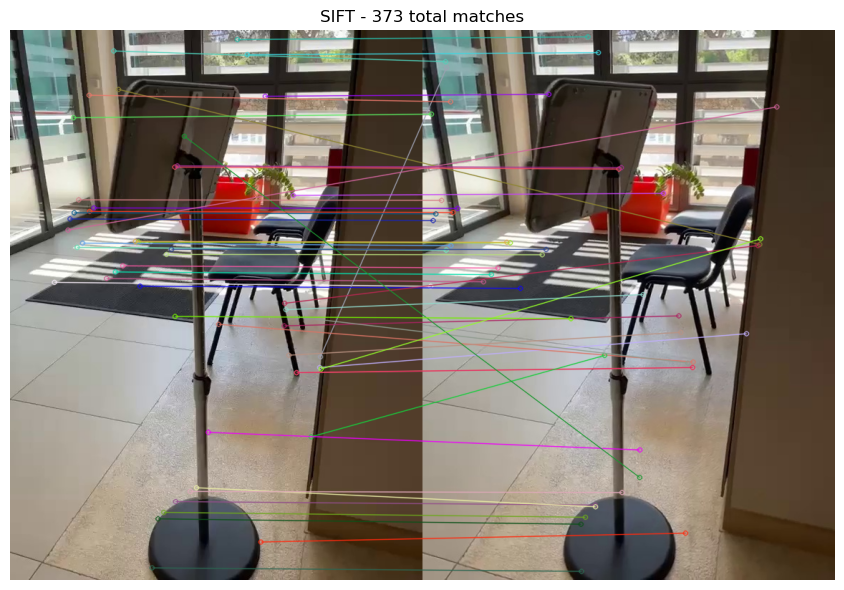

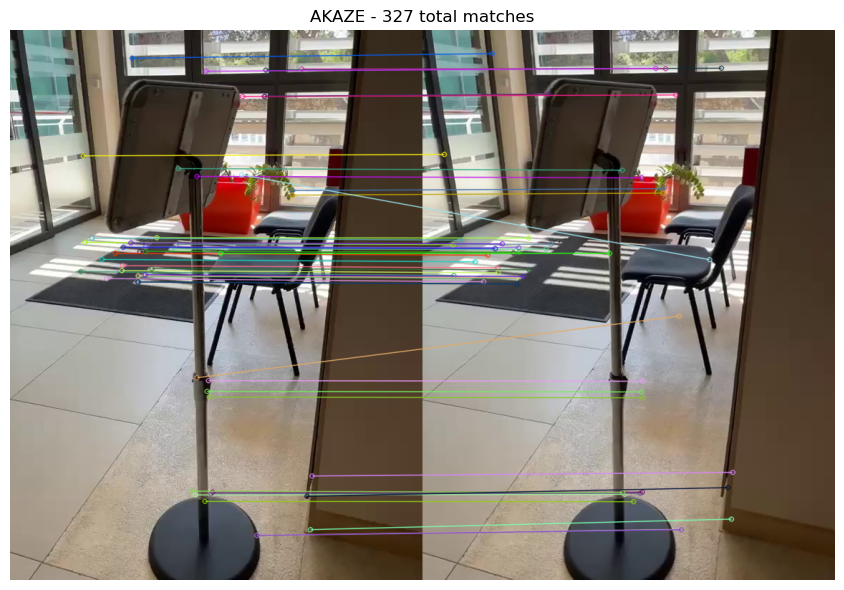


Matching frames 10 and 15:


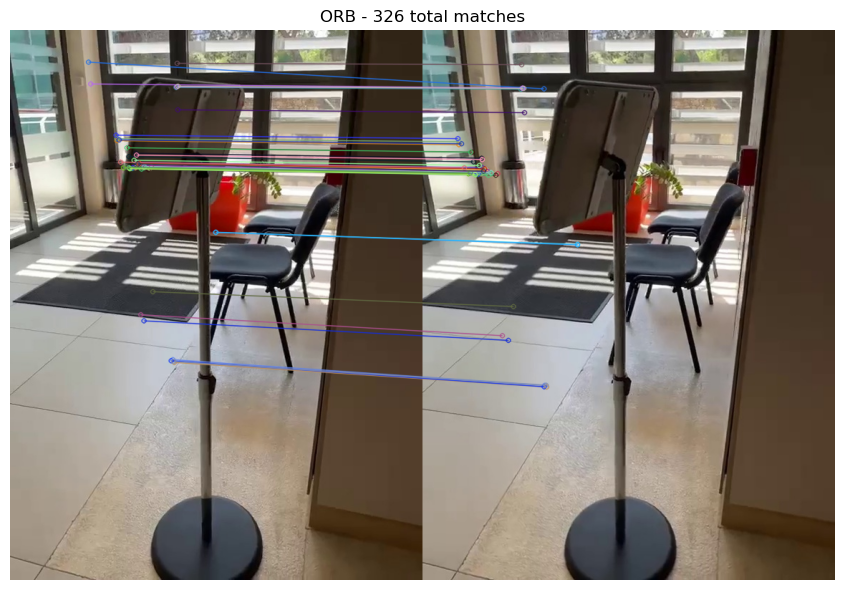

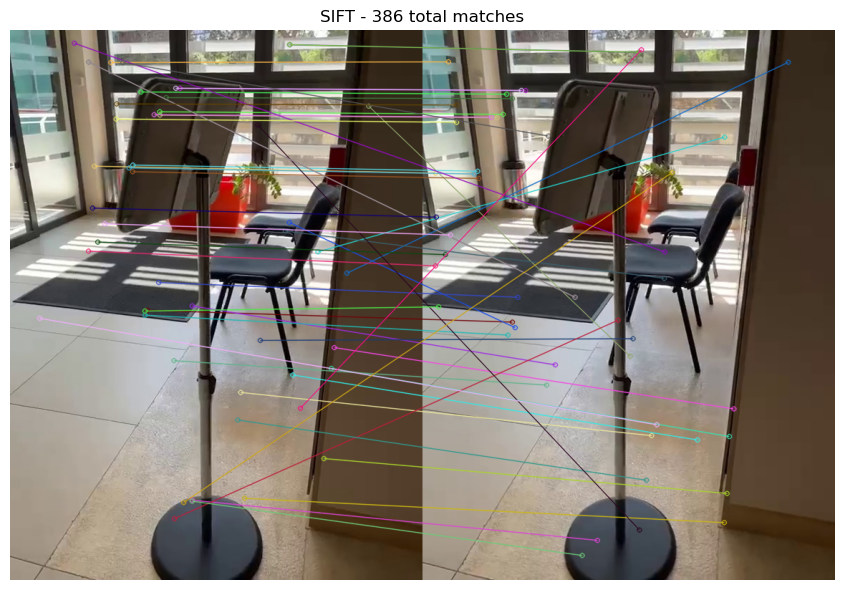

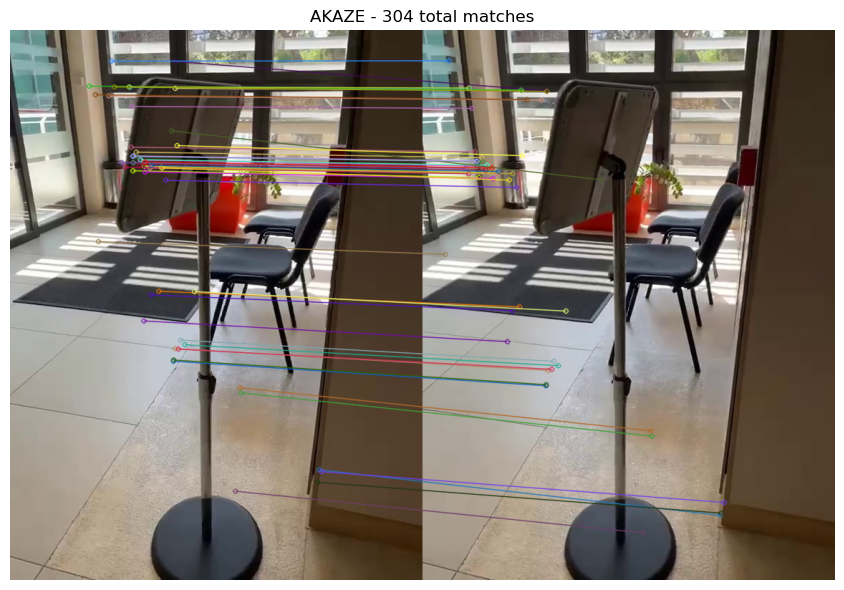


Matching frames 20 and 25:


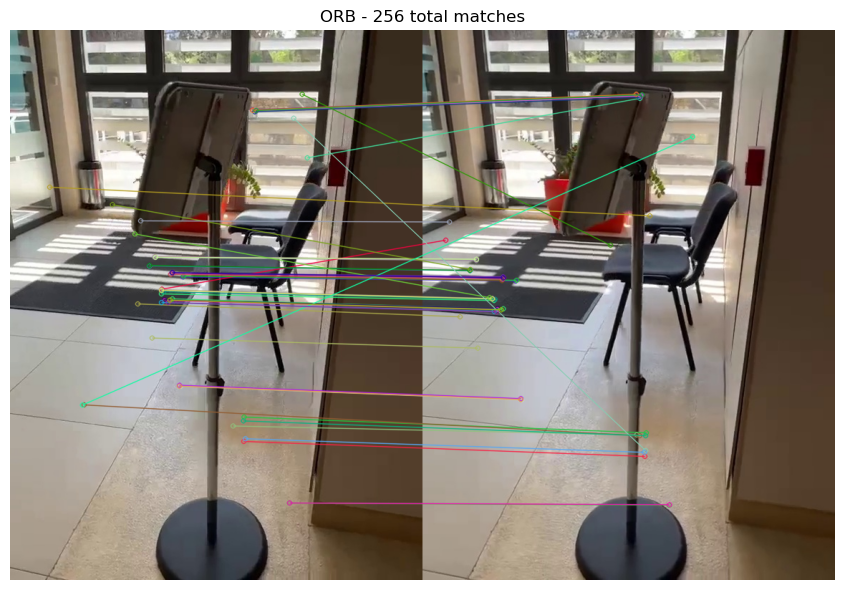

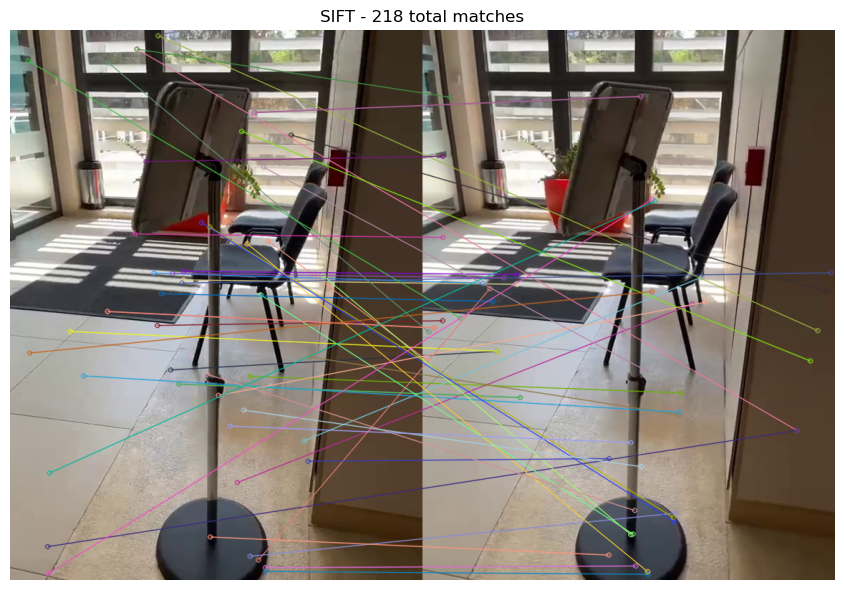

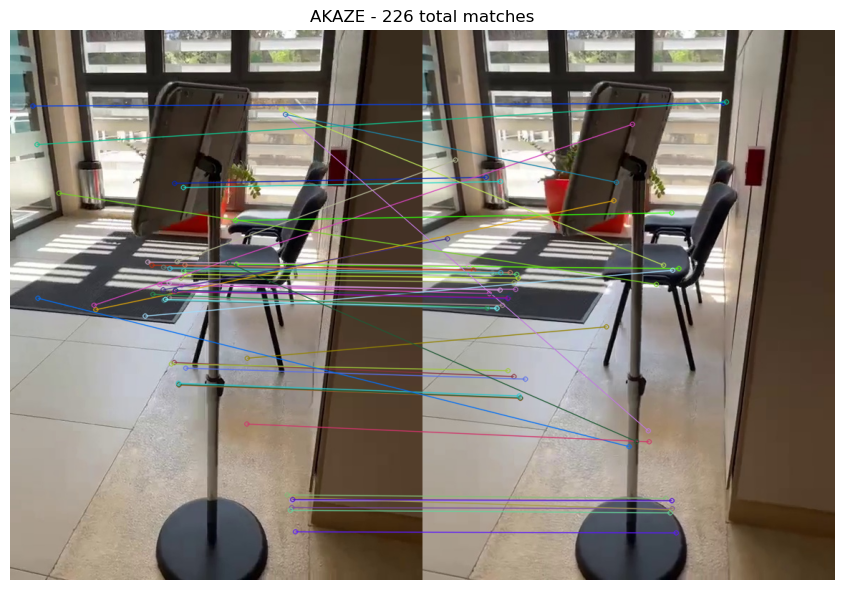


Matching frames 30 and 35:


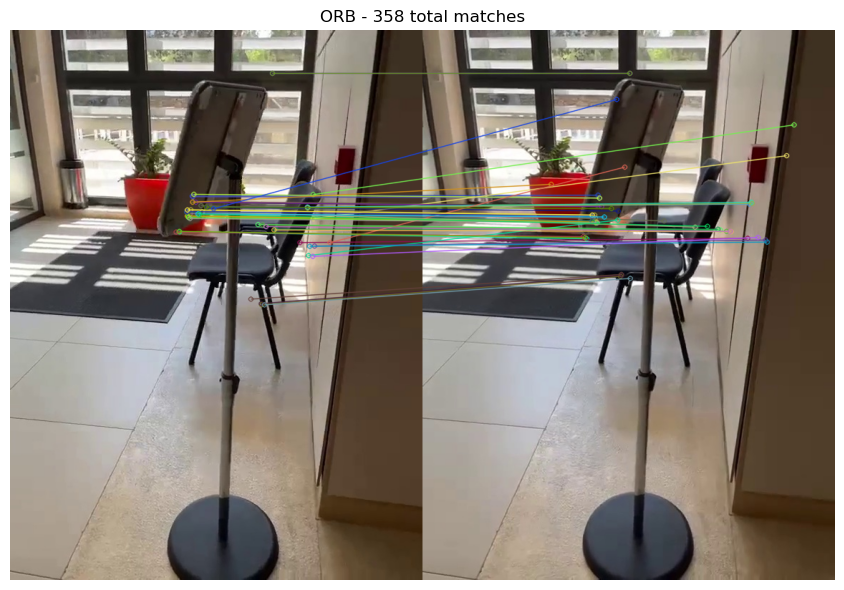

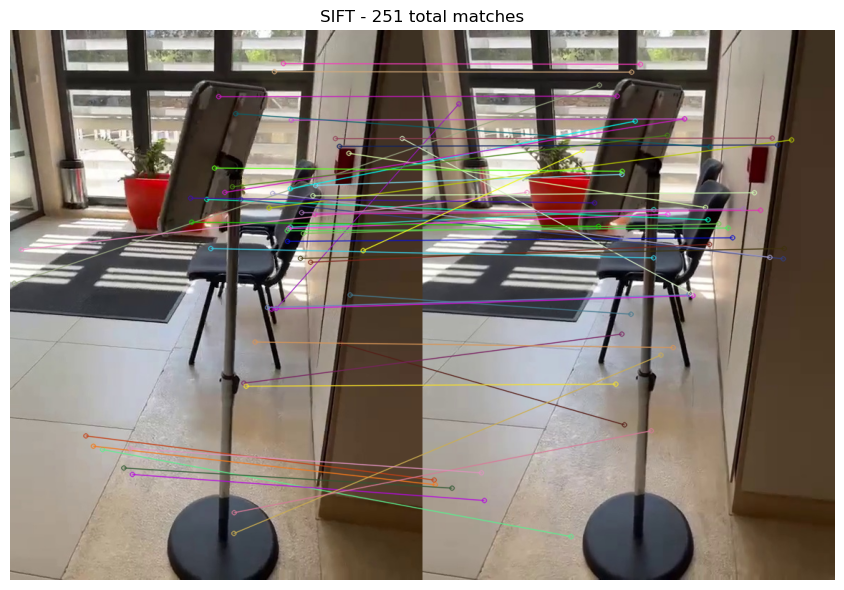

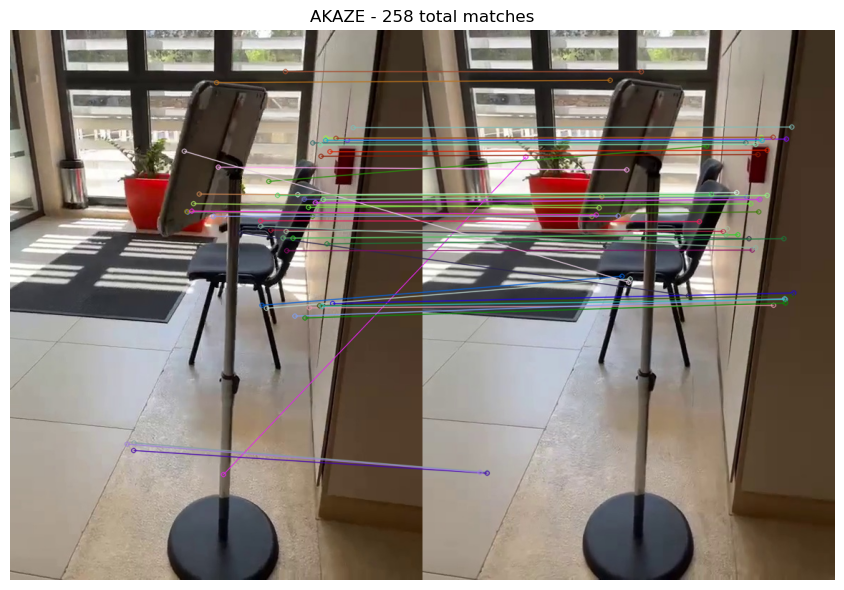


Matching frames 40 and 45:


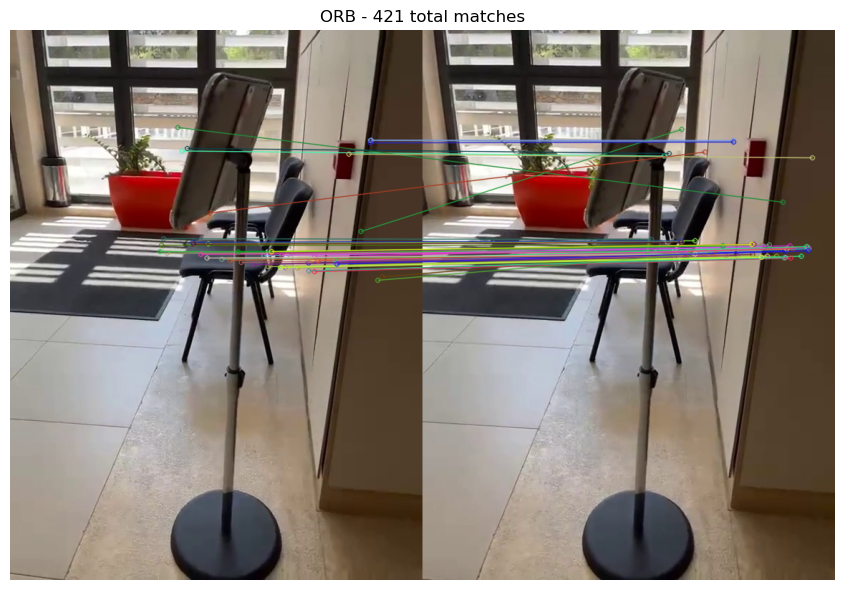

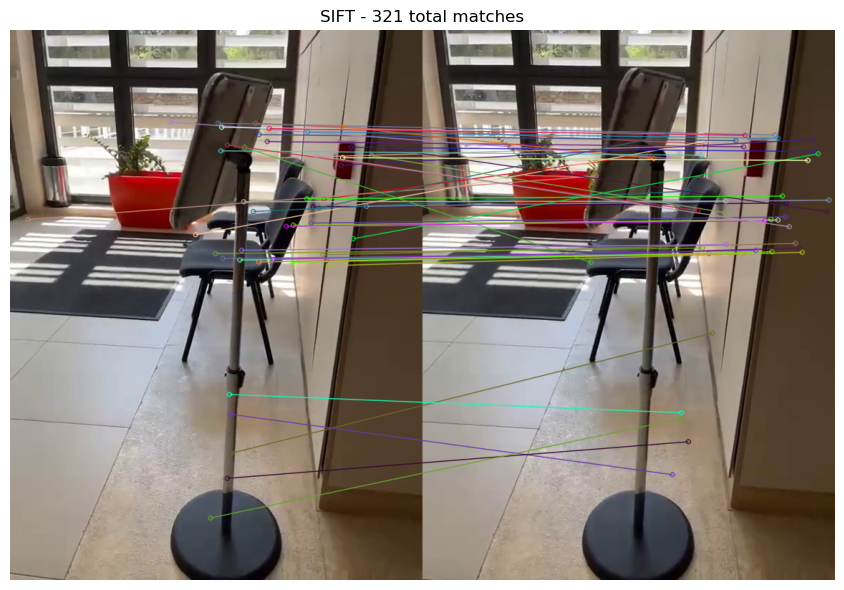

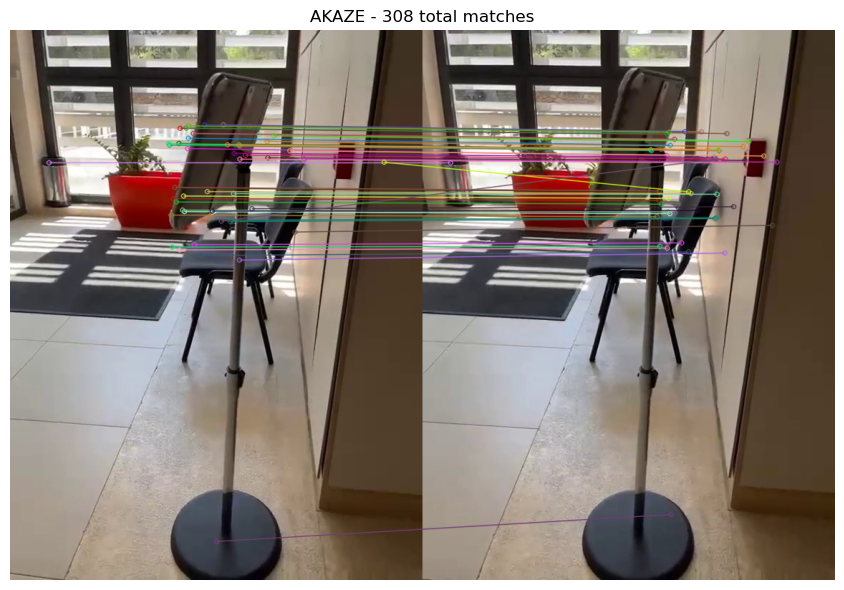

In [16]:
def match_and_draw(img1, kps1, desc1, img2, kps2, desc2, method="ORB"):
    if method == "ORB":
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    else:
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    matches = bf.match(desc1, desc2)
    matches = sorted(matches, key=lambda x: x.distance)

    # Draws top 50 matches
    matched_img = cv2.drawMatches(img1, kps1, img2, kps2, matches[:50], None, flags=2)
    plt.figure(figsize=(14, 6))
    plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
    plt.title(f"{method} - {len(matches)} total matches")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    return matches

def load_frame(idx):
    path = os.path.join(frames_output, f"frame_{idx:04d}.jpg")
    return cv2.imread(path, cv2.IMREAD_COLOR)

def compare_matching_performance(frame_pairs, kps_dict, desc_dict, methods=["ORB", "SIFT", "AKAZE"]):
    for idx1, idx2 in frame_pairs:
        img1 = load_frame(idx1)
        img2 = load_frame(idx2)

        if img1 is None or img2 is None:
            print(f"Skipped pair ({idx1}, {idx2}) due to missing frame.")
            continue

        print(f"\nMatching frames {idx1} and {idx2}:")

        for method in methods:
            match_and_draw(
                img1, kps_dict[method][idx1], desc_dict[method][idx1],
                img2, kps_dict[method][idx2], desc_dict[method][idx2],
                method=method
            )
            
frame_pairs = [(0, 5), (10, 15), (20, 25), (30, 35), (40, 45)]
compare_matching_performance(frame_pairs, kps_dict, desc_dict)